In [1]:
!pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:

!pip  install -q timm


In [3]:
!pip install -q ultralytics timm opencv-python matplotlib

In [4]:

!pip install -q gdown
!gdown --id 1t5YDg4_X97edTd0q-i82UdhapIgsM1pP -O /content/MergedYOLO.zip
!unzip -o /content/MergedYOLO.zip -d /content/




Streaming output truncated to the last 5000 lines.
  inflating: /content/images/WEB03811.jpg  
  inflating: /content/images/WEB08539.jpg  
  inflating: /content/images/WEB08924.jpg  
  inflating: /content/images/WEB08191.jpg  
  inflating: /content/images/AoF06528.jpg  
  inflating: /content/images/PublicDataset00418.jpg  
  inflating: /content/images/WEB04046.jpg  
  inflating: /content/images/nonfire_2749.jpg  
  inflating: /content/images/WEB05474.jpg  
  inflating: /content/images/nonfire_0889.jpg  
  inflating: /content/images/WEB03795.jpg  
  inflating: /content/images/nonfire_1761.jpg  
  inflating: /content/images/nonfire_1384.jpg  
  inflating: /content/images/nonfire_1317.jpg  
  inflating: /content/images/nonfire_2393.jpg  
  inflating: /content/images/WEB08832.jpg  
  inflating: /content/images/nonfire_0171.jpg  
  inflating: /content/images/WEB08702.jpg  
  inflating: /content/images/WEB05644.jpg  
  inflating: /content/images/WEB04614.jpg  
  inflating: /content/images/Pu

creating dataset splits

In [ ]:
import os, random, shutil, textwrap
from glob import glob

IMG_SRC = "/content/images"
LBL_SRC = "/content/labels"
DEST_ROOT = "/content/dataset"

for s in ["train", "val", "test"]:
    os.makedirs(f"{DEST_ROOT}/images/{s}", exist_ok=True)
    os.makedirs(f"{DEST_ROOT}/labels/{s}", exist_ok=True)

img_paths = []
for img_path in glob(f"{IMG_SRC}/*.*"):
    base = os.path.splitext(os.path.basename(img_path))[0]
    lbl_path = f"{LBL_SRC}/{base}.txt"
    if os.path.exists(lbl_path) and os.path.getsize(lbl_path) > 0:
        with open(lbl_path) as f:
            lines = [line.strip() for line in f if line.strip()]
            if lines:
                img_paths.append(img_path)

random.seed(42)
random.shuffle(img_paths)

n = len(img_paths)
n_train = int(0.8 * n)
n_val = int(0.1 * n)
splits_dict = {
    "train": img_paths[:n_train],
    "val": img_paths[n_train:n_train + n_val],
    "test": img_paths[n_train + n_val:]
}

for split, paths in splits_dict.items():
    for img in paths:
        base = os.path.basename(img)
        lbl = f"{LBL_SRC}/{os.path.splitext(base)[0]}.txt"
        shutil.copy(img, f"{DEST_ROOT}/images/{split}/{base}")
        shutil.copy(lbl, f"{DEST_ROOT}/labels/{split}/{os.path.basename(lbl)}")

yaml_text = textwrap.dedent(f"""
path: {DEST_ROOT}
train: images/train
val: images/val
test: images/test
nc: 3
names: [fire, smoke, nonfire]
""").strip()

with open("/content/fire_smoke.yaml", "w") as f:
    f.write(yaml_text)

print(" Dataset split complete!")
print("Train images:", len(splits_dict['train']))
print("Val images:", len(splits_dict['val']))
print("Test images:", len(splits_dict['test']))


 Dataset split complete!
Train images: 7200
Val images: 900
Test images: 900


Stage A training for 20 epocs

In [ ]:
from ultralytics import YOLO
from ultralytics.nn.modules import Detect
import torch
import timm
import torch.nn as nn
import shutil

yolo = YOLO("/content/bestyolo.pt")

tinyvit = timm.create_model(
    "tiny_vit_21m_224.in1k",
    pretrained=True,
    features_only=True,
    out_indices=(1, 2, 3)
)

new_head = Detect(
    nc=yolo.model.model[-1].nc,
    ch=tinyvit.feature_info.channels()
)

yolo.model.model[0] = tinyvit
yolo.model.model[-1] = new_head
print(" TinyViT backbone successfully plugged into YOLOv8!")

for param in yolo.model.parameters():
    param.requires_grad = True

results_A = yolo.train(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    epochs=20,
    batch=8,
    lr0=3e-4,
    device="cuda" if torch.cuda.is_available() else "cpu",
    workers=2,
    project="runs/detect",
    name="A_TinyViT_full",
    verbose=True
)


 TinyViT backbone successfully plugged into YOLOv8!
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/bestyolo.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=A_TinyViT_full2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask

train: Scanning /content/dataset/labels/train.cache... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:00<?, ?it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved
albu

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 457.7±151.3 MB/s, size: 67.1 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved


Plotting labels to runs/detect/A_TinyViT_full2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0003' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/A_TinyViT_full2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20     0.666G      1.896      56.44      2.626         47        224: 100%|██████████| 900/900 [01:40<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.05it/s]


                   all        900       1644      0.394      0.466      0.449      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20     0.734G      1.198      2.102      1.561         33        224: 100%|██████████| 900/900 [01:34<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.52it/s]


                   all        900       1644      0.544      0.546      0.552       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20     0.805G       1.09      1.299      1.423         25        224: 100%|██████████| 900/900 [01:31<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.60it/s]


                   all        900       1644      0.649      0.596      0.598      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20     0.805G      1.035      1.165      1.368         42        224: 100%|██████████| 900/900 [01:30<00:00,  9.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.34it/s]


                   all        900       1644      0.663      0.603      0.627      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20     0.805G     0.9892      1.074      1.326         37        224: 100%|██████████| 900/900 [01:31<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.14it/s]

                   all        900       1644        0.7      0.635      0.644      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20     0.857G     0.9523      1.021      1.293         29        224: 100%|██████████| 900/900 [01:30<00:00,  9.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.36it/s]


                   all        900       1644      0.662      0.621      0.655      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20     0.859G     0.9278     0.9607      1.277         29        224: 100%|██████████| 900/900 [01:30<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.66it/s]

                   all        900       1644      0.708      0.647      0.663      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20     0.859G     0.9107     0.9333      1.259         25        224: 100%|██████████| 900/900 [01:30<00:00,  9.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.71it/s]

                   all        900       1644      0.685      0.646      0.676      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20     0.859G     0.8812     0.8915      1.241         24        224: 100%|██████████| 900/900 [01:29<00:00, 10.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.84it/s]


                   all        900       1644      0.717      0.654      0.688      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20     0.859G     0.8715     0.8732      1.228         22        224: 100%|██████████| 900/900 [01:29<00:00, 10.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.50it/s]

                   all        900       1644        0.7      0.672      0.687      0.509


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20     0.859G      0.959     0.8346      1.268         17        224: 100%|██████████| 900/900 [01:29<00:00, 10.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.47it/s]


                   all        900       1644      0.749      0.669      0.694      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20     0.859G     0.9368     0.7807      1.245         11        224: 100%|██████████| 900/900 [01:29<00:00, 10.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.05it/s]


                   all        900       1644      0.725      0.684      0.703       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20     0.859G     0.9141     0.7611      1.223          8        224: 100%|██████████| 900/900 [01:29<00:00, 10.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.64it/s]

                   all        900       1644       0.74      0.669      0.702      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20     0.859G     0.9029     0.7247      1.218         13        224: 100%|██████████| 900/900 [01:27<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.51it/s]

                   all        900       1644      0.748      0.691      0.714      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20     0.859G     0.8884     0.6991      1.202         13        224: 100%|██████████| 900/900 [01:28<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.49it/s]


                   all        900       1644      0.771      0.681      0.719      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      0.93G      0.874     0.6812      1.199         16        224: 100%|██████████| 900/900 [01:28<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.68it/s]

                   all        900       1644      0.783      0.694      0.731      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      0.93G     0.8603     0.6609      1.186         14        224: 100%|██████████| 900/900 [01:27<00:00, 10.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.57it/s]

                   all        900       1644      0.768      0.709      0.731      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      0.93G     0.8456     0.6418      1.181         16        224: 100%|██████████| 900/900 [01:30<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.54it/s]

                   all        900       1644      0.758      0.708       0.73      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      0.93G     0.8411     0.6227      1.169          8        224: 100%|██████████| 900/900 [01:27<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.88it/s]

                   all        900       1644      0.774      0.709      0.737      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20     0.932G      0.818     0.6025      1.156         15        224: 100%|██████████| 900/900 [01:28<00:00, 10.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.64it/s]

                   all        900       1644      0.789      0.709      0.741      0.556



20 epochs completed in 0.539 hours.
Optimizer stripped from runs/detect/A_TinyViT_full2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/A_TinyViT_full2/weights/best.pt, 22.5MB

Validating runs/detect/A_TinyViT_full2/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.31it/s]


                   all        900       1644      0.789      0.709      0.741      0.556
                  fire        528        571      0.759      0.704      0.757      0.456
                 smoke        309        767      0.645       0.43      0.472      0.217
               nonfire        306        306      0.962      0.993      0.994      0.994
Speed: 0.0ms preprocess, 1.3ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/A_TinyViT_full2


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/A_TinyViT_full/weights/best.pt'

Stage B training, 20 epochs with loss graph

Actual P5 channel dim seen by YOLO = 32
Epoch 01/20  loss=3.1012  lr=3.0000e-03
Epoch 02/20  loss=3.0677  lr=3.0000e-03
Epoch 03/20  loss=3.0582  lr=3.0000e-03
Epoch 04/20  loss=3.0518  lr=3.0000e-03
Epoch 05/20  loss=3.0469  lr=3.0000e-03
Epoch 06/20  loss=3.0428  lr=3.0000e-03
Epoch 07/20  loss=3.0392  lr=3.0000e-03
Epoch 08/20  loss=3.0360  lr=3.0000e-03
Epoch 09/20  loss=3.0331  lr=3.0000e-03
Epoch 10/20  loss=3.0305  lr=3.0000e-03
Epoch 11/20  loss=3.0282  lr=3.0000e-03
Epoch 12/20  loss=3.0261  lr=3.0000e-03
Epoch 13/20  loss=3.0242  lr=3.0000e-03
Epoch 14/20  loss=3.0225  lr=3.0000e-03
Epoch 15/20  loss=3.0209  lr=3.0000e-03
Epoch 16/20  loss=3.0195  lr=3.0000e-03
Epoch 17/20  loss=3.0183  lr=3.0000e-03
Epoch 18/20  loss=3.0171  lr=3.0000e-03
Epoch 19/20  loss=3.0160  lr=3.0000e-03
Epoch 20/20  loss=3.0150  lr=3.0000e-03
Projector saved to /content/projector_tinyvit_stageB_384D.pth


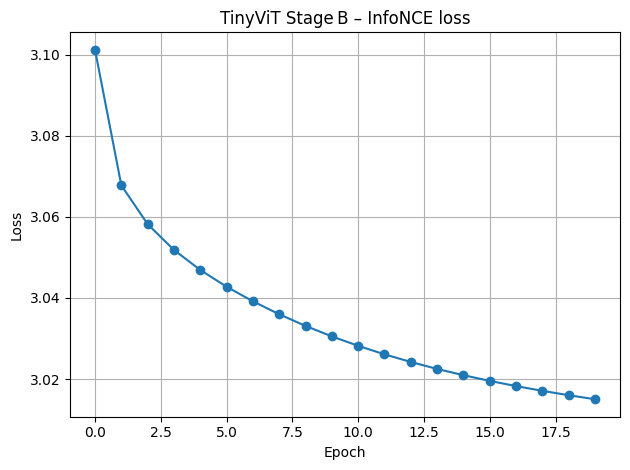

In [ ]:
import os, random, torch, torch.nn as nn, torchvision, matplotlib.pyplot as plt
from glob import glob
from ultralytics import YOLO
from transformers import AutoTokenizer, AutoModel
from torchvision.transforms.functional import resize

device = "cuda" if torch.cuda.is_available() else "cpu"

tiny_ckpt = "/content/tinyvit_stageA_trained.pt"
model_A = YOLO(tiny_ckpt)
vit = model_A.model.model[0].eval().to(device)
for p in vit.parameters():
    p.requires_grad = False

with torch.no_grad():
    dummy = torch.zeros(1, 3, 224, 224, device=device)
    feat = vit(dummy)
    feat = feat[-1] if isinstance(feat, (list, tuple)) else feat
    C_out = feat.shape[1]
print("Actual P5 channel dim seen by YOLO =", C_out)

proj = nn.Linear(C_out, 384, bias=False).to(device)

tok = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
txtE = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L6-v2").eval().to(device)

@torch.no_grad()
def txt_embed(sent):
    t = tok(sent, padding=True, return_tensors="pt").to(device)
    v = txtE(**t).last_hidden_state[:, 0]
    return nn.functional.normalize(v, dim=-1)

idx2cap = {0: "blazing fire", 1: "rising smoke", 2: "scene with no fire"}

def img_embed(imgs):
    with torch.no_grad():
        f = vit(imgs)
        f = f[-1] if isinstance(f, (list, tuple)) else f
        pooled = f.mean((-2, -1))
    z = proj(pooled)
    return nn.functional.normalize(z, dim=-1)

IMG_DIR, LBL_DIR = "/content/images", "/content/labels"
paths = [p for p in glob(f"{IMG_DIR}/*.*") if os.path.exists(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt")]
random.shuffle(paths)

def loader(batch=32):
    for i in range(0, len(paths), batch):
        imgs, caps = [], []
        for p in paths[i:i + batch]:
            try:
                img = torchvision.io.read_image(p)
                if img.shape[0] != 3:
                    continue
                img = resize(img[:3].float() / 255., [224, 224])
                cls = int(open(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt").read().split()[0])
                imgs.append(img)
                caps.append(idx2cap[cls])
            except Exception:
                continue
        if len(imgs) > 1:
            yield torch.stack(imgs).to(device), caps

epochs, T, lr = 20, 0.07, 3e-3
opt = torch.optim.AdamW(proj.parameters(), lr=lr, weight_decay=1e-4)
loss_fn = nn.NLLLoss()
loss_log = []

for ep in range(epochs):
    tot, seen = 0.0, 0
    for imgs, caps in loader():
        sim = img_embed(imgs) @ txt_embed(caps).T / T
        lbl = torch.arange(sim.size(0), device=device)
        loss = loss_fn(torch.log_softmax(sim, dim=-1), lbl)

        opt.zero_grad()
        loss.backward()
        opt.step()
        tot += loss.item() * imgs.size(0)
        seen += imgs.size(0)

    avg = tot / seen
    loss_log.append(avg)
    print(f"Epoch {ep+1:02d}/{epochs}  loss={avg:.4f}  lr={lr:.4e}")

proj_path = "/content/projector_tinyvit_stageB_384D.pth"
torch.save(proj.state_dict(), proj_path)
print("Projector saved to", proj_path)

plt.plot(loss_log, marker='o')
plt.title("TinyViT Stage B – InfoNCE loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.tight_layout()
plt.show()


saving model

In [ ]:

proj_path = "/content/projector_tinyvit_stageB_384D.pt"
torch.save(proj.state_dict(), proj_path)
print(" Projector saved to:", proj_path)


 Projector saved to: /content/projector_tinyvit_stageB_384D.pt


stage C training

In [ ]:
import os, shutil, torch, pandas as pd, matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.nn.modules import Detect

device = "cuda" if torch.cuda.is_available() else "cpu"

model = YOLO("/content/tinyvit_stageA_trained.pt")

for n, p in model.model.named_parameters():
    if n.startswith("model.0"):
        p.requires_grad = False
    else:
        p.requires_grad = True

results_C = model.train(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    epochs=20,
    batch=8,
    lr0=1e-3,
    device=device,
    workers=2,
    project="runs/detect",
    name="C_TinyViT_head_finetune",
    verbose=True
)

best_c = "runs/detect/C_TinyViT_head_finetune/weights/best.pt"
stageC_path = "/content/tinyvit_stageC_head_finetuned.pt"
shutil.copy(best_c, stageC_path)
print(f"Stage C model saved → {stageC_path}")

csv_path = os.path.join(results_C.save_dir, "results.csv")
df = pd.read_csv(csv_path)

plt.figure(figsize=(7,4))
plt.plot(df["      train/box_loss"], label="train box")
plt.plot(df["        val/box_loss"], label="val box")
plt.title("Stage C – box loss")
plt.xlabel("epoch"); plt.ylabel("loss"); plt.legend(); plt.grid(True)
plt.tight_layout(); plt.show()

plt.figure(figsize=(7,4))
plt.plot(df[" metrics/mAP50-95"])
plt.title("Stage C – mAP@50‑95")
plt.xlabel("epoch"); plt.ylabel("mAP50‑95")
plt.grid(True); plt.tight_layout(); plt.show()


Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fire_smoke.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/tinyvit_stageA_trained.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=C_TinyViT_head_finetune3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspecti

train: Scanning /content/dataset/labels/train.cache... 7200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7200/7200 [00:00<?, ?it/s]

train: /content/dataset/images/train/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
train: /content/dataset/images/train/WEB07561.jpg: corrupt JPEG restored and saved
albu

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 409.7±152.8 MB/s, size: 67.1 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved


Plotting labels to runs/detect/C_TinyViT_head_finetune3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/C_TinyViT_head_finetune3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      1.81G     0.8337     0.8123      1.203         47        224: 100%|██████████| 900/900 [01:39<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.23it/s]

                   all        900       1644      0.751      0.694      0.719      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      1.81G     0.8363     0.7964      1.197         33        224: 100%|██████████| 900/900 [01:35<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.34it/s]


                   all        900       1644      0.718      0.691      0.712      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      1.81G     0.8459     0.8037      1.199         25        224: 100%|██████████| 900/900 [01:33<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.11it/s]

                   all        900       1644      0.741      0.684      0.708      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      1.81G      0.844     0.7989      1.198         42        224: 100%|██████████| 900/900 [01:33<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  8.13it/s]

                   all        900       1644      0.733      0.654      0.699      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      1.81G     0.8308     0.7928       1.19         37        224: 100%|██████████| 900/900 [01:33<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.19it/s]

                   all        900       1644      0.701      0.653      0.686      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      1.81G     0.8159     0.7743      1.181         29        224: 100%|██████████| 900/900 [01:33<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.47it/s]

                   all        900       1644       0.77      0.668      0.716      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      1.81G     0.8063      0.751      1.177         29        224: 100%|██████████| 900/900 [01:33<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.60it/s]

                   all        900       1644      0.758      0.637      0.703      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      1.81G     0.8096     0.7466      1.175         25        224: 100%|██████████| 900/900 [01:33<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.68it/s]


                   all        900       1644      0.723      0.683      0.712      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      1.81G     0.7852       0.72      1.161         24        224: 100%|██████████| 900/900 [01:32<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.94it/s]

                   all        900       1644      0.745      0.685      0.723      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      1.81G     0.7857     0.7087      1.155         22        224: 100%|██████████| 900/900 [01:33<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.06it/s]


                   all        900       1644      0.719       0.67      0.721      0.522
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      1.81G     0.8622     0.6535       1.18         17        224: 100%|██████████| 900/900 [01:33<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.21it/s]

                   all        900       1644      0.743       0.68      0.701      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      1.81G     0.8524     0.6292      1.171         11        224: 100%|██████████| 900/900 [01:32<00:00,  9.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.07it/s]

                   all        900       1644      0.724      0.695      0.703      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      1.82G     0.8348     0.6075      1.151          8        224: 100%|██████████| 900/900 [01:33<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.21it/s]

                   all        900       1644      0.756      0.708      0.736      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      1.82G     0.8287     0.5925      1.152         13        224: 100%|██████████| 900/900 [01:32<00:00,  9.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.18it/s]


                   all        900       1644      0.766      0.699      0.737      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      1.82G     0.8099     0.5696      1.137         13        224: 100%|██████████| 900/900 [01:32<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:07<00:00,  8.04it/s]

                   all        900       1644      0.791        0.7      0.739      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      1.82G     0.8094     0.5595       1.14         16        224: 100%|██████████| 900/900 [01:32<00:00,  9.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.22it/s]

                   all        900       1644      0.784       0.71      0.744      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      1.82G     0.7991     0.5513      1.131         14        224: 100%|██████████| 900/900 [01:32<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  8.37it/s]

                   all        900       1644      0.773       0.71       0.74      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      1.82G     0.7874     0.5501      1.127         16        224: 100%|██████████| 900/900 [01:31<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00, 10.30it/s]

                   all        900       1644      0.768      0.719      0.745      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      1.82G     0.7848      0.529      1.118          8        224: 100%|██████████| 900/900 [01:31<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:06<00:00,  9.18it/s]

                   all        900       1644       0.77      0.723      0.752       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      1.82G     0.7697     0.5238      1.111         15        224: 100%|██████████| 900/900 [01:33<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.99it/s]

                   all        900       1644       0.79      0.722      0.752      0.563



20 epochs completed in 0.561 hours.
Optimizer stripped from runs/detect/C_TinyViT_head_finetune3/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/C_TinyViT_head_finetune3/weights/best.pt, 22.5MB

Validating runs/detect/C_TinyViT_head_finetune3/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 57/57 [00:05<00:00,  9.94it/s]


                   all        900       1644       0.79      0.721      0.752      0.563
                  fire        528        571       0.76      0.717      0.771      0.465
                 smoke        309        767      0.637      0.456       0.49      0.229
               nonfire        306        306      0.972       0.99      0.994      0.994
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/C_TinyViT_head_finetune3


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/C_TinyViT_head_finetune/weights/best.pt'

In [ ]:
plotting stage C metrics

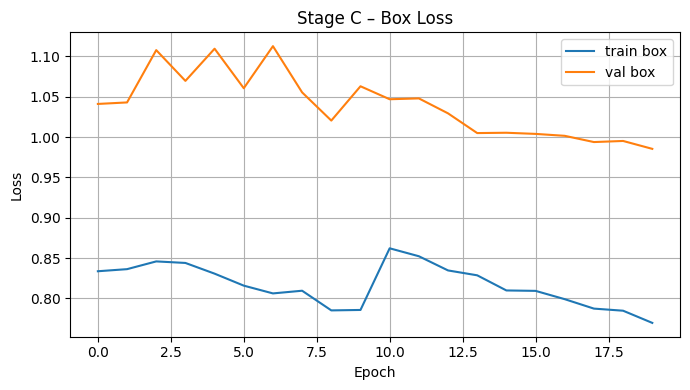

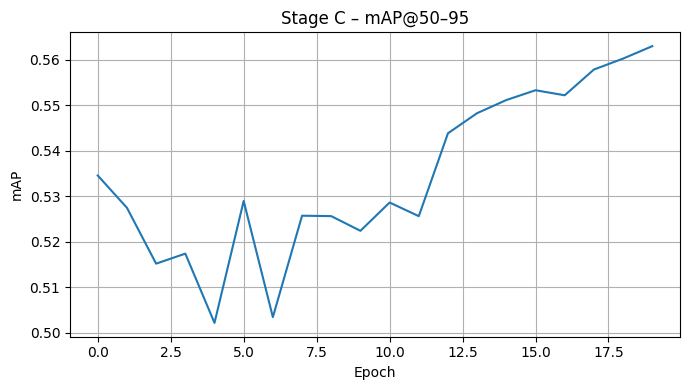

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


csv_path = "runs/detect/C_TinyViT_head_finetune3/results.csv"
df = pd.read_csv(csv_path)
df.columns = df.columns.str.strip()


box_loss_train = "train/box_loss"
box_loss_val = "val/box_loss"
map_col = "metrics/mAP50-95(B)"


plt.figure(figsize=(7, 4))
plt.plot(df[box_loss_train], label="train box")
plt.plot(df[box_loss_val], label="val box")
plt.title("Stage C – Box Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


plt.figure(figsize=(7, 4))
plt.plot(df[map_col])
plt.title("Stage C – mAP@50–95")
plt.xlabel("Epoch")
plt.ylabel("mAP")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import shutil
import os

best_c = "runs/detect/C_TinyViT_head_finetune3/weights/best.pt"
stageC_path = "/content/tinyvit_stageC_head_finetuned.pt"

if os.path.exists(best_c):
    shutil.copy(best_c, stageC_path)
    print(f"Stage C model saved → {stageC_path}")
else:
    print(" best.pt not found at the specified path.")


Stage C model saved → /content/tinyvit_stageC_head_finetuned.pt


EVALUATE ACCURACY ACROSS STAGES


▶ Evaluating Stage A …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1852.1±910.6 MB/s, size: 153.6 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.79it/s]


                   all        900       1644      0.788      0.709      0.741      0.556
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/val2
▶ Evaluating Stage C …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2064.8±1429.4 MB/s, size: 136.5 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07557.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:06<00:00, 17.94it/s]


                   all        900       1644      0.788      0.723      0.752      0.563
Speed: 0.1ms preprocess, 2.1ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val3
▶ Evaluating Stage B (ViT + projector + MiniLM cosine)…


Stage B images:  86%|████████▌ | 7745/9000 [01:22<00:13, 91.70it/s]

skip /content/images/nonfire_1335.jpg Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [1, 3, 3, 224, 224]


Stage B images: 100%|██████████| 9000/9000 [01:40<00:00, 89.54it/s] 



=== Comparison table ===
         mAP@50  mAP@50‑95  Precision  Recall
Stage A   0.741      0.556      0.788   0.709
Stage B   0.738      0.739      0.740   0.747
Stage C   0.752      0.563      0.788   0.723


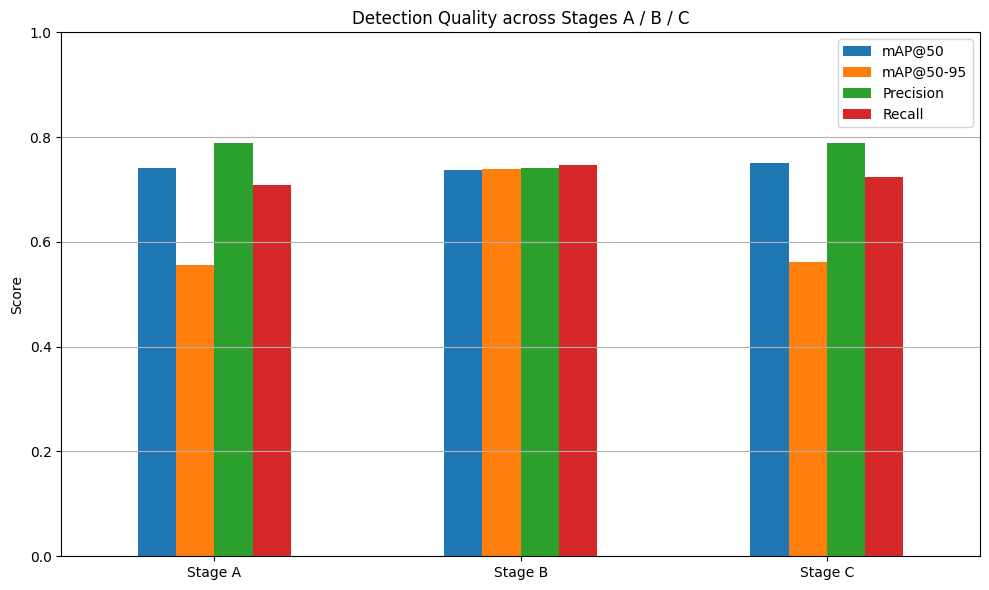

In [ ]:
import os, random, torch, torch.nn as nn, pandas as pd, matplotlib.pyplot as plt
import torchvision
from torchvision.transforms.functional import resize
from glob import glob
from tqdm import tqdm
from ultralytics import YOLO
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

device = "cuda" if torch.cuda.is_available() else "cpu"

def yolo_metrics(det_metrics):
    box = det_metrics.box
    mAP50 = box.map50 if hasattr(box, "map50") else float(getattr(box, "map", 0.0))
    mAP5095 = box.map if hasattr(box, "map") else 0.0
    precision = box.mp if hasattr(box, "mp") else 0.0
    recall = box.mr if hasattr(box, "mr") else 0.0
    return [float(mAP50), float(mAP5095), float(precision), float(recall)]

stageA_pt = "/content/tinyvit_stageA_trained.pt"
model_A = YOLO(stageA_pt)

print("▶ Evaluating Stage A …")
A_det = model_A.val(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    batch=8,
    device=device,
    verbose=False,
)
A_metrics = yolo_metrics(A_det)

stageC_pt = "/content/tinyvit_stageC_head_finetuned.pt"
model_C = YOLO(stageC_pt)

print("▶ Evaluating Stage C …")
C_det = model_C.val(
    data="/content/fire_smoke.yaml",
    imgsz=224,
    batch=8,
    device=device,
    verbose=False,
)
C_metrics = yolo_metrics(C_det)

print("▶ Evaluating Stage B (ViT + projector + MiniLM cosine)…")

vit = YOLO(stageA_pt).model.model[0].eval().to(device)
for p in vit.parameters(): p.requires_grad = False

projector = nn.Linear(32, 384, bias=False).to(device)
projector.load_state_dict(
    torch.load("/content/projector_tinyvit_stageB_384D.pth", map_location=device)
)
projector.eval()

tok = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
txt = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L6-v2").eval().to(device)

@torch.no_grad()
def txt_embed(sentences):
    t = tok(sentences, padding=True, return_tensors="pt").to(device)
    return nn.functional.normalize(txt(**t).last_hidden_state[:, 0], dim=-1)

@torch.no_grad()
def img_embed(img):
    feat = vit(img)[-1]
    pooled = feat.mean((-2, -1))
    return nn.functional.normalize(projector(pooled), dim=-1)

IMG_DIR = "/content/images"
LBL_DIR = "/content/labels"
idx2cap = {0: "blazing fire", 1: "rising smoke", 2: "scene with no fire"}

paths = [
    p for p in glob(f"{IMG_DIR}/*.*")
    if os.path.exists(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt")
]
random.shuffle(paths)

text_vecs = txt_embed(list(idx2cap.values()))

true_lbls, pred_lbls = [], []
for p in tqdm(paths, desc="Stage B images"):
    try:
        img = torchvision.io.read_image(p)[:3] / 255.
        if img.shape[0] != 3:
            continue
        img = resize(img, [224, 224]).unsqueeze(0).to(device)
        lbl = int(open(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt").read().split()[0])
        sim = (img_embed(img) @ text_vecs.T).squeeze(0)
        pred = sim.argmax().item()
        true_lbls.append(lbl)
        pred_lbls.append(pred)
    except Exception as e:
        print("skip", p, e)

acc = accuracy_score(true_lbls, pred_lbls)
f1 = f1_score(true_lbls, pred_lbls, average="macro")
prec = precision_score(true_lbls, pred_lbls, average="macro")
rec = recall_score(true_lbls, pred_lbls, average="macro")
B_metrics = [acc, f1, prec, rec]

labels = ["mAP@50", "mAP@50‑95", "Precision", "Recall"]
df = pd.DataFrame(
    [A_metrics, B_metrics, C_metrics],
    index=["Stage A", "Stage B", "Stage C"],
    columns=labels,
)
print("\n=== Comparison table ===")
print(df.round(3))

ax = df.plot(kind="bar", figsize=(10, 6), rot=0)
ax.set_title("Detection Quality across Stages A / B / C")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.0)
ax.grid(True, axis="y")
plt.tight_layout()
plt.show()


Visualise final trained models predictions with bounding boxes

 Found 900 unseen test images.
 Selected 40 images with fire/smoke detections.


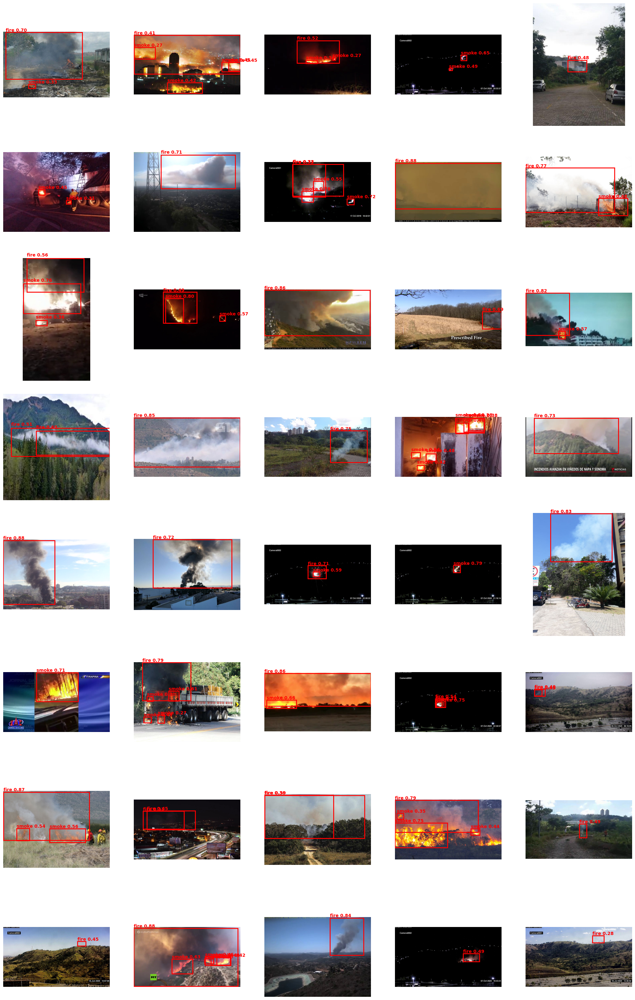

In [ ]:

import glob
import os
import cv2
import math
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO


yolo = YOLO('/content/tinyvit_stageC_head_finetuned.pt')


id2name = yolo.names  

test_image_dir = '/content/dataset/images/val'

test_image_paths = glob.glob(f"{test_image_dir}/*.*")

print(f" Found {len(test_image_paths)} unseen test images.")


results = yolo.predict(
    source=test_image_paths,
    imgsz=224,
    conf=0.25,
    save=False,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    verbose=False
)


selected = [
    (img_path, res)
    for img_path, res in zip(test_image_paths, results)
    if any(id2name[int(cls)] in ('fire', 'smoke') for cls in res.boxes.cls)
][:40]

print(f" Selected {len(selected)} images with fire/smoke detections.")


cols = 5
rows = math.ceil(len(selected) / cols)
plt.figure(figsize=(20, rows * 4))

for i, (img_path, res) in enumerate(selected):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(img)


    for box, cls_id, conf in zip(res.boxes.xyxy, res.boxes.cls, res.boxes.conf):
        label = id2name[int(cls_id)]
        if label not in ('fire', 'smoke'):
            continue

        x1, y1, x2, y2 = map(int, box.tolist())
        ax.add_patch(plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            edgecolor='red', linewidth=2, fill=False
        ))
        ax.text(x1, y1 - 5, f'{label} {conf:.2f}', color='red',
                fontsize=10, weight='bold')

    ax.set_title("", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()


visualise heatmaps

DELETING THIS BLOCK BECAUSE OF SIZW ISSUES WITH UPLOADING-SPOKE TO SAAD TA, PICTURES CAN BE FOUND IN RESEARCH PAPER

use BLIP to generate captions and visualise predictions

class wise visualisations


 Showing 20 images for class: FIRE


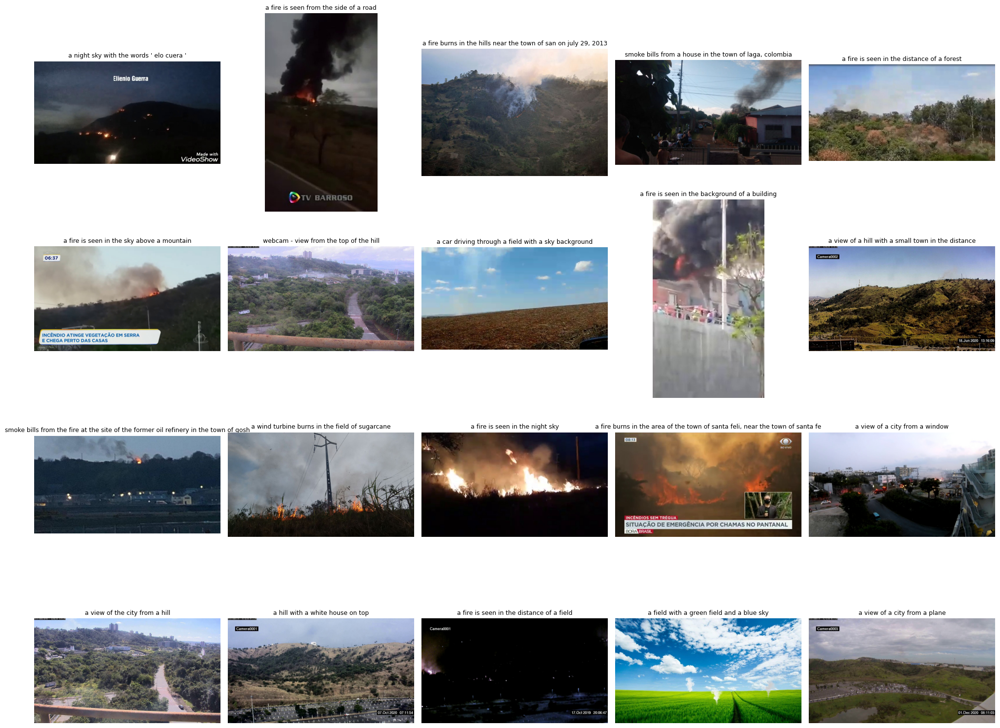


 Showing 20 images for class: SMOKE


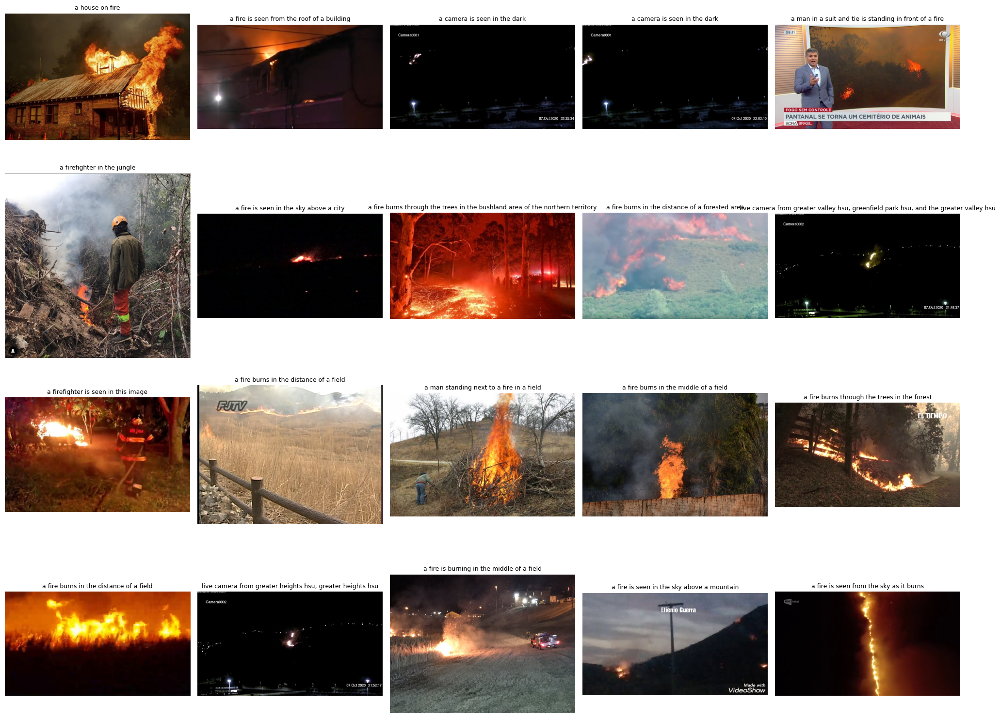


 Showing 20 images for class: NONFIRE


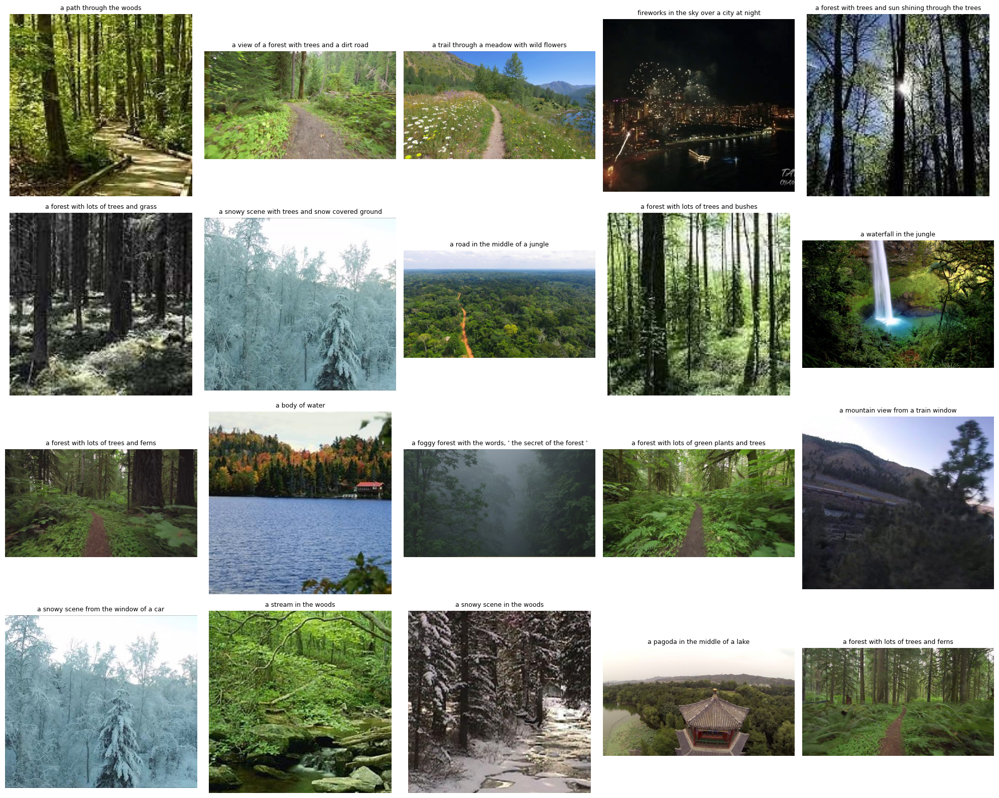

In [38]:

from transformers import BlipProcessor, BlipForConditionalGeneration
import os


device = "cuda" if torch.cuda.is_available() else "cpu"

yolo = YOLO('/content/tinyvit_stageC_head_finetuned.pt')
vit = yolo.model.model[0].to(device)


layer_index = 2
vit.eval()
test_input = torch.randn(1, 3, 224, 224).to(device)
with torch.no_grad():
    features = vit(test_input)
    if isinstance(features, (list, tuple)):
        features = features[layer_index]
    feature_dim = features.shape[1]


projector = torch.nn.Linear(feature_dim, 512).to(device)


blip_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

blip_preprocess = T.Compose([T.Resize((384, 384)), T.ToTensor()])
tinyvit_preprocess = T.Compose([T.Resize((224, 224)), T.ToTensor()])

def extract_feature_vector(image_tensor, vit_model, layer_index=2):
    vit_model.eval()
    with torch.no_grad():
        features = vit_model(image_tensor)
        if isinstance(features, (list, tuple)):
            features = features[layer_index]
        pooled = torch.mean(features, dim=[2, 3])
    return pooled  # [1, C]


image_paths = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp']:
    image_paths.extend(glob(os.path.join(image_dir, ext)))


assert len(image_paths) > 0, f" No test images found in {image_dir}"

random.seed(42)
random.shuffle(image_paths)

class_map = {0: 'fire', 1: 'smoke', 2: 'nonfire'}
classified_images = {'fire': [], 'smoke': [], 'nonfire': []}


results = yolo.predict(source=image_paths, imgsz=224, conf=0.25, device=device, verbose=False)

for img_path, res in zip(image_paths, results):
    if res.boxes is not None and len(res.boxes.cls) > 0:
        pred_class = int(res.boxes.cls[0].item())  # Top-1 box
        label = res.names[pred_class]
        if label in classified_images and len(classified_images[label]) < 20:
            classified_images[label].append(img_path)


for label in ['fire', 'smoke', 'nonfire']:
    paths = classified_images[label]
    if len(paths) == 0:
        print(f" No examples found for {label.upper()}")
        continue

    print(f"\n Showing {len(paths)} images for class: {label.upper()}")
    cols = 5
    rows = (len(paths) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, path in enumerate(paths):
        image = Image.open(path).convert("RGB")


        blip_inputs = blip_processor(image, return_tensors="pt").to(device)
        with torch.no_grad():
            out = blip_model.generate(**blip_inputs)
        caption = blip_processor.decode(out[0], skip_special_tokens=True)


        img_tensor = tinyvit_preprocess(image).unsqueeze(0).to(device)
        with torch.no_grad():
            feature_vec = extract_feature_vector(img_tensor, vit, layer_index)
            projected_vec = projector(feature_vec)
            projected_vec = projected_vec / projected_vec.norm(dim=-1, keepdim=True)


        plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(caption, fontsize=9)

    plt.tight_layout()
    plt.show()
